In [2]:
%load_ext autoreload
%autoreload 2
from ASD_Circuits import *

### Regions

In [51]:
STR_ontology = pd.read_csv("/Users/jiayao/Work/ASD_Circuits/src/dat/ontology.csv")
STRs = [l.strip() for l in open("/Users/jiayao/Work/ASD_Circuits/src/dat/213_structures.txt", 'rt').readlines()]
#STR_ontology = STR_ontology[(STR_ontology["coarse"]=="X") | 
#                            (STR_ontology["KEY"].isin(STRs))]
STR_ontology = STR_ontology[["KEY", "id", "parent_structure_id", "coarse", "depth"]]

In [52]:
STR2Region = TraceSTR(STR_ontology, STRs, see="Subiculum_dorsal_part")

In [55]:
write_matchfout = open("dat/structure2region.map", "wt")
for k,v in STR2Region.items():
    fout.write("%s\t%s\n"%(k,v))

### Expresion Bias

In [89]:
#exp_energy = pd.read_csv("/Users/jiayao/Work/ASD_Circuits/dat/allen-mouse-exp/energy-conn-model.csv")
exp_energy = pd.read_csv("dat/qn.energy-conn-model.csv")

In [90]:
exp_energy.head(2)

,ROW,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
0,1,4.810838,1.985447,1.491432,1.815990,1.238867,2.347209,1.461795,6.585172,1.477614,...,1.426256,2.199883,1.245470,2.709023,2.049518,3.491203,5.680949,3.202331,2.084024,2.501414
1,2,1.615279,0.727014,0.960485,2.440234,3.577253,2.536681,2.225293,2.442893,1.806849,...,1.431953,0.798303,2.446021,2.375973,3.353963,2.006104,1.555972,3.394996,2.777769,1.330975


In [91]:
writer = csv.writer(open("dat/exp.zscore.csv", "wt"))
writer.writerow(exp_energy.columns.values)
for i, row in exp_energy.iterrows():
    zscores = [str(row["ROW"])]
    exps = row[1:].values
    _exps = exps[~np.isnan(exps)]
    mean, std = np.mean(_exps), np.std(_exps)
    for i, exp in enumerate(exps):
        zscore = (exp - mean) / std  
        zscores.append(zscore)
    writer.writerow(zscores)
    break

In [92]:
exp1 = pd.read_csv("../dat/allen-mouse-exp/energy-zscore-conn-model.csv")
exp2 = pd.read_csv("dat/exp.zscore.csv")

In [93]:
for i in range(100):
    e1 = exp1.loc[i, :]
    e2 = exp2.loc[i, :]
    e1 = e1[~np.isnan(e1)]
    e2 = e2[~np.isnan(e2)]
    r,p = pearsonr(e1, e2)
    print(r, np.mean(e1), np.mean(e2), np.std(e1), np.std(e2))
    break

ValueError: operands could not be broadcast together with shapes (204,) (214,) 

In [ ]:
plt.scatter(e1, e2)

In [5]:
# ASD genes and Control gene sets
DatDir = "/Users/jiayao/Work/BrainDisorders/data/DenovoVariants/"
SSCProLGD = pd.read_excel(DatDir + "wigler2014ProLGD.xlsx")
#ProMIS.to_excel(DatDir + "wigler2014ProMIS.xlsx", index=False)
SSCSibNSYN = pd.read_excel(DatDir + "wigler2014SibNSYN.xlsx")

In [6]:
print("SSC Proband LGD ",len(set(SSCProLGD["effectGene"].values)))
print("SSC Sibling LGD + DMIS",len(set(SSCSibNSYN["effectGene"].values)))

SSC Proband LGD  352
SSC Sibling LGD + DMIS 1216


In [7]:
GeneSymbol2Entrez = {}
HGNC = pd.read_csv("/Users/jiayao/Work/Resources/protein-coding_gene.txt", delimiter="\t")
GeneSymbol2Entrez = zip(HGNC["symbol"].values, HGNC["entrez_id"].values)

/Users/jiayao/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (38,48) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
CaseFil = "/Users/jiayao/Work/ASD_Circuits/dat/ssc/wigler-predicted-allen-mouse.txt"
ControlFil = "/Users/jiayao/Work/ASD_Circuits/dat/ssc/wigler-sib-ns.txt"
CaseGeneEntrez = [l.strip() for l in open(CaseFil)]
ControlGeneEntrez = [l.strip() for l in open(ControlFil)]
print("%d Case gene, %d Control gene"%(len(CaseGeneEntrez), len(ControlGeneEntrez)))

225 Case gene, 1361 Control gene


In [9]:
# Load Exp Zscore Matrix
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
ExpZscoreMat = pd.read_csv(ExpZscoreMat)

In [10]:
ExpZscoreMat.head(2)

,ROW,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
0,1,0.160640,-0.539153,-0.504043,-0.761513,-0.693056,1.644456,-0.925718,NaN,-0.445816,...,-0.826146,1.096054,-1.042356,-0.149321,1.309056,-0.090982,0.224140,-0.079631,1.733742,0.713978
1,2,-0.476558,-0.559858,-0.517535,-0.524070,0.155116,-0.414605,-0.132720,-0.366087,-0.228981,...,-0.477847,-0.507564,-0.227819,-0.304092,-0.342912,-0.505963,-0.469515,-0.360610,-0.054245,1.149715


In [11]:
#StructureFil = open("../dat/allen-mouse-exp/Structures.txt", 'wt')
#for structure in ExpZscoreMat.columns:
#    StructureFil.write("{}\n".format(structure))

In [12]:
CaseDF = ExpZscoreMat[ExpZscoreMat["ROW"].isin(set(CaseGeneEntrez))]
ControlDF = ExpZscoreMat[ExpZscoreMat["ROW"].isin(set(ControlGeneEntrez))]
print(CaseDF.shape, ControlDF.shape)

(225, 214) (1076, 214)


In [13]:
Structures = list(ExpZscoreMat.columns[1:])

In [14]:
Structures[:10]

['Anterior_amygdalar_area',
 'Anterior_cingulate_area_dorsal_part',
 'Anterior_cingulate_area_ventral_part',
 'Nucleus_accumbens',
 'Anterodorsal_nucleus',
 'Anterior_hypothalamic_nucleus',
 'Agranular_insular_area_dorsal_part',
 'Agranular_insular_area_posterior_part',
 'Agranular_insular_area_ventral_part',
 'Nucleus_ambiguus']

In [15]:
Biases_mean = {}
Biases_median = {}
for struc in Structures:
    bias_mean = StructureGeneSetBias(struc, CaseDF, ControlDF, method="mean")
    bias_median = StructureGeneSetBias(struc, CaseDF, ControlDF, method="median")
    Biases_mean[struc] = bias_mean
    Biases_median[struc] = bias_median

In [20]:
# Write to file
res = sorted(Biases_median.items(), key=lambda k:k[1], reverse=True)
Fout = open("dat/Structures.expr.bias.rank", 'wt')
for k,v in res:
    #print(k,v)
    Fout.write("%s\t%.3f\n"%(k, v))

In [40]:
mean, median = [],[]
for struct in Structures:
    mean.append(Biases_mean[struct])
    median.append(Biases_median[struct])
print(pearsonr(mean, median))
print(spearmanr(mean, median))

(0.940158414723962, 1.2778078071817463e-100)
SpearmanrResult(correlation=0.9379037405529986, pvalue=5.607879045754311e-99)


Text(0, 0.5, 'bias w/median')

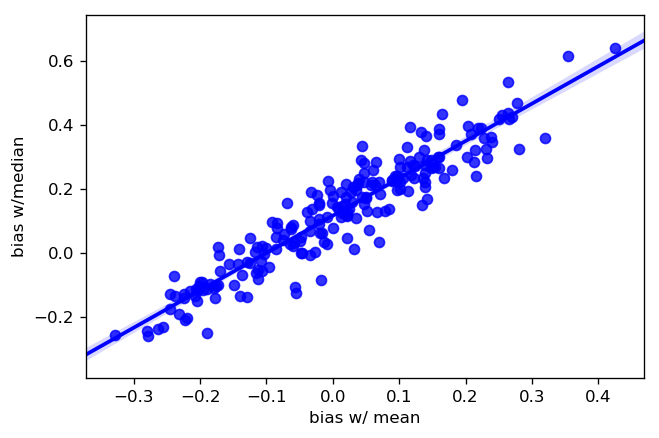

In [45]:
fig, ax = plt.subplots(dpi=120)
ax = sns.regplot(x=mean, y=median, color="blue", ci=95)
r, p = spearmanr(mean, median)
#ax.text(x = 2.5, y=60, s="Spearmanr=%.2f\nP=%.2f"%(r,p))
ax.set_xlabel("bias w/ mean")
ax.set_ylabel("bias w/median")

### SCZ

In [2]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
ExpZscoreMat = pd.read_csv(ExpZscoreMat, index_col="ROW")
ExpZscoreMat.head(2)

,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,Nucleus_ambiguus,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
ROW,,,,,,,,,,,,,,,,,,,,,
1,0.160640,-0.539153,-0.504043,-0.761513,-0.693056,1.644456,-0.925718,NaN,-0.445816,-0.491676,...,-0.826146,1.096054,-1.042356,-0.149321,1.309056,-0.090982,0.224140,-0.079631,1.733742,0.713978
2,-0.476558,-0.559858,-0.517535,-0.524070,0.155116,-0.414605,-0.132720,-0.366087,-0.228981,-0.431621,...,-0.477847,-0.507564,-0.227819,-0.304092,-0.342912,-0.505963,-0.469515,-0.360610,-0.054245,1.149715


In [3]:
scz_gwas = [int(x.strip()) for x in open("../dat/genes/scz.gwas.entrez.list", "rt")]
scz_denovo = [int(x.strip()) for x in open("../dat/genes/scz.denovo.entrez.list", "rt")]
scz_psyencode = [int(x.strip()) for x in open("../dat/genes/scz.psyencode.entrez.list", "rt")]
QuantileAVGScoring(ExpZscoreMat, scz_gwas,
                  csv_fil="dat/bias/scz.gwas.quantilescore.rank.tsv")
QuantileAVGScoring(ExpZscoreMat, scz_denovo,
                  csv_fil="dat/bias/scz.denovo.quantilescore.rank.tsv")
QuantileAVGScoring(ExpZscoreMat, scz_psyencode,
                  csv_fil="dat/bias/scz.psyencode.quantilescore.rank.tsv")

In [37]:
asd_sib = [int(x.strip()) for x in open("../dat/genes/asd.sib.entrez.list", "rt")]
asd_sibrand = np.random.choice(asd_sib, 250)
QuantileAVGScoring(ExpZscoreMat, asd_sibrand,
                  csv_fil="dat/bias/asd.sibrand.quantilescore.rank.tsv")

In [13]:
# Bias Dist
scz_gwas_qbias = pd.read_csv("dat/bias/scz.gwas.quantilescore.rank.tsv", delimiter="\t")
scz_denovo_qbias = pd.read_csv("dat/bias/scz.denovo.quantilescore.rank.tsv", delimiter="\t")
scz_psyencode_qbias = pd.read_csv("dat/bias/scz.psyencode.quantilescore.rank.tsv", delimiter="\t")
asd_sib_qbias = pd.read_csv("dat/bias/asd.sib.quantilescore.rank.tsv", delimiter="\t")
asd_siblgd_qbias = pd.read_csv("dat/bias/asd.siblgd.quantilescore.rank.tsv", delimiter="\t")
asd_sibrand250_qbias = pd.read_csv("dat/bias/asd.sibrand.quantilescore.rank.tsv", delimiter="\t")

      scz_gwas_qbias	0.536	0.530	0.005	1.957e-03
    scz_denovo_qbias	0.536	0.530	0.006	7.502e-04
 scz_psyencode_qbias	0.541	0.530	0.010	9.445e-06


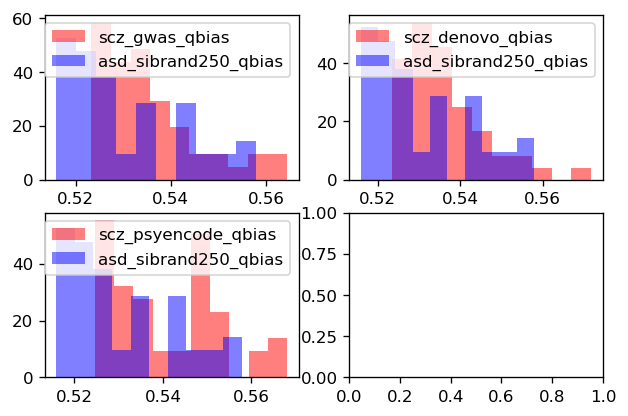

In [41]:
PlotBiasDistandP(scz_gwas_qbias, scz_denovo_qbias, scz_psyencode_qbias, asd_sibrand250_qbias, 
                 labels=["scz_gwas_qbias", "scz_denovo_qbias", "scz_psyencode_qbias", "asd_sibrand250_qbias"])

      scz_gwas_qbias	0.536	0.548	-0.012	1.000e+00
    scz_denovo_qbias	0.536	0.548	-0.011	9.998e-01
 scz_psyencode_qbias	0.541	0.548	-0.007	9.799e-01


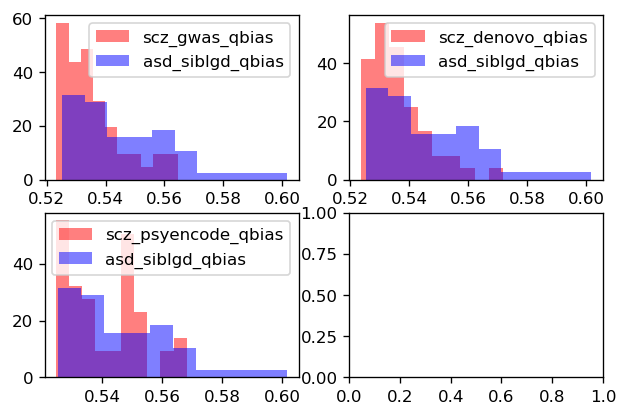

In [42]:
PlotBiasDistandP(scz_gwas_qbias, scz_denovo_qbias, scz_psyencode_qbias, asd_siblgd_qbias, 
                 labels=["scz_gwas_qbias", "scz_denovo_qbias", "scz_psyencode_qbias", "asd_siblgd_qbias"])

      scz_gwas_qbias	0.503	0.502	0.001	2.381e-01
    scz_denovo_qbias	0.507	0.502	0.005	4.919e-03
 scz_psyencode_qbias	0.506	0.502	0.003	7.933e-02


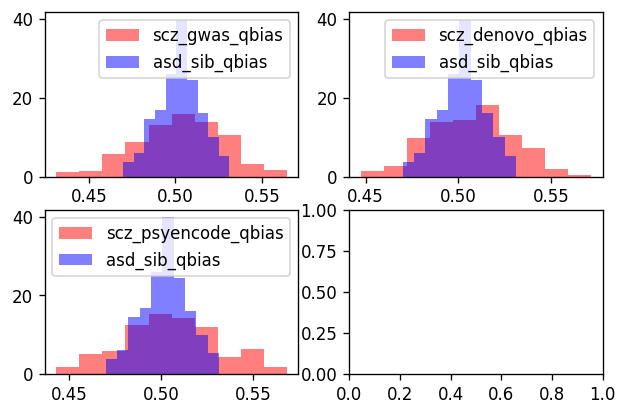

In [107]:
PlotBiasDistandP(scz_gwas_qbias, scz_denovo_qbias, scz_psyencode_qbias, asd_sib_qbias, topN=213,
                 labels=["scz_gwas_qbias", "scz_denovo_qbias", "scz_psyencode_qbias", "asd_sib_qbias"])

In [105]:
topN = 50
denovo = scz_denovo_qbias["Score"].values[:topN]
gwas = scz_gwas_qbias["Score"].values[:topN]
print(np.mean(denovo), np.mean(gwas))
t, p = scipy.stats.mannwhitneyu(denovo, gwas, alternative='greater')
print(t,p)

0.5363876018637279 0.5355988613016565
1340.0 0.26861839220139533


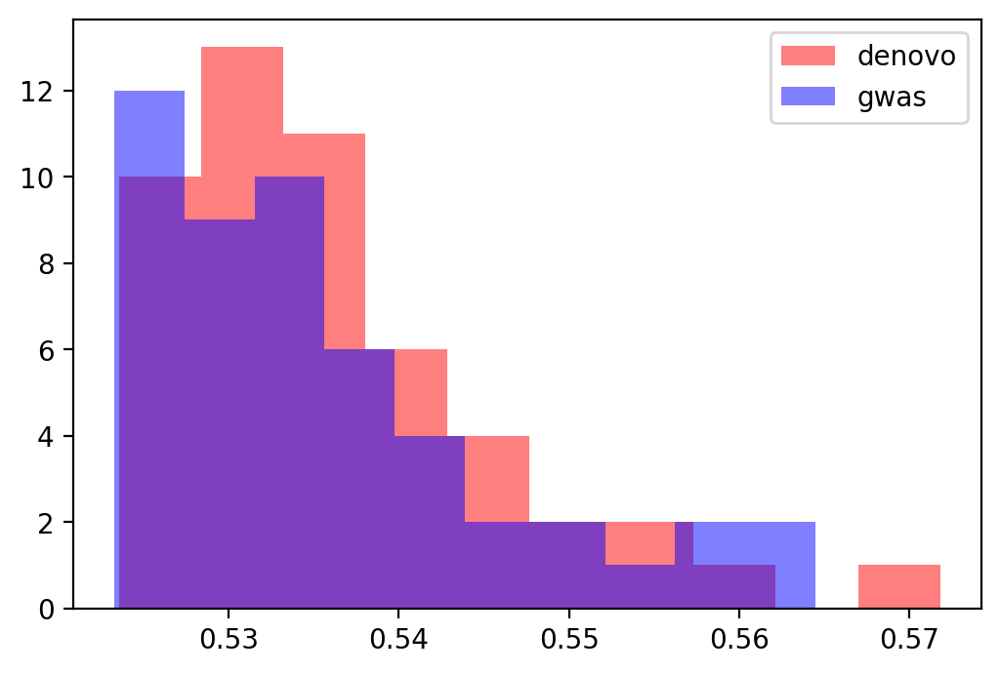

In [106]:
plt.figure(dpi=200)
plt.hist(denovo, color="red", label="denovo", alpha=0.5)
plt.hist(gwas, color="blue", label="gwas", alpha=.5)
plt.legend()
plt.show()

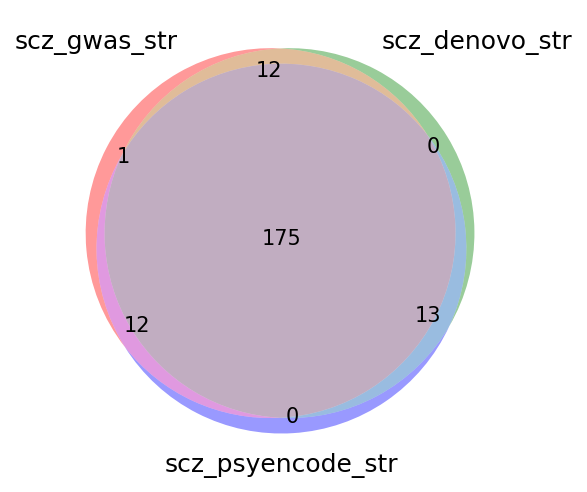

In [14]:
from matplotlib_venn import venn3, venn3_circles
scz_gwas_str = scz_gwas_qbias["STR"].values[:200]
scz_denovo_str = scz_denovo_qbias["STR"].values[:200]
scz_psyencode_str = scz_psyencode_qbias["STR"].values[:200]
plt.figure(dpi=150)
venn3([set(scz_gwas_str), set(scz_denovo_str), set(scz_psyencode_str)], 
      set_labels = ('scz_gwas_str', 'scz_denovo_str', 'scz_psyencode_str'))

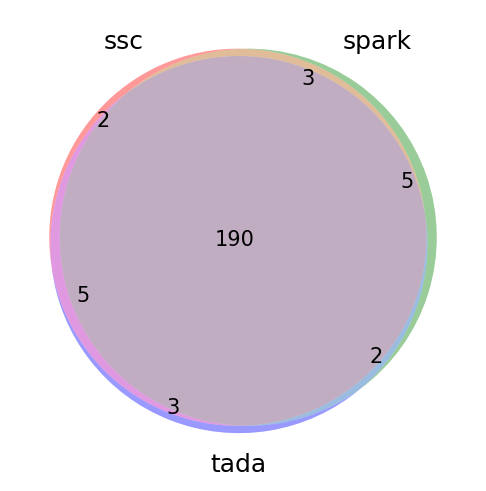

In [11]:
from matplotlib_venn import venn3, venn3_circles
ssc_str = ssc["STR"].values[:200]
spark_str = spark["STR"].values[:200]
tada_str = tada["STR"].values[:200]
plt.figure(dpi=150)
venn3([set(ssc_str), set(spark_str), set(tada_str)], 
      set_labels = ('ssc', 'spark', 'tada'))

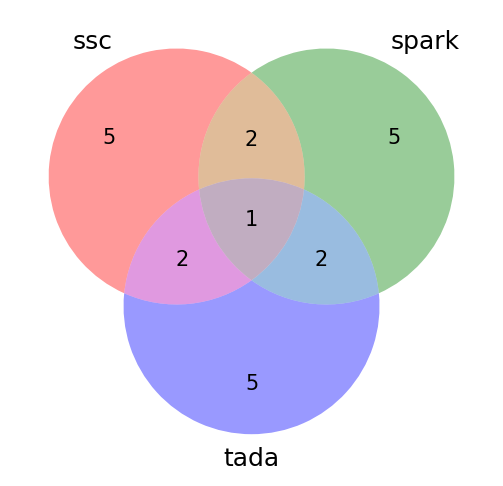

In [8]:
from matplotlib_venn import venn3, venn3_circles
ssc_str = ssc["STR"].values[:10]
spark_str = spark["STR"].values[:10]
tada_str = tada["STR"].values[:10]
plt.figure(dpi=150)
venn3([set(ssc_str), set(spark_str), set(tada_str)], 
      set_labels = ('ssc', 'spark', 'tada'))

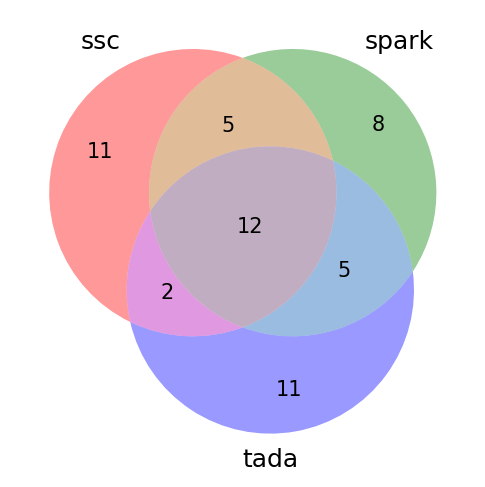

In [6]:
from matplotlib_venn import venn3, venn3_circles
ssc_str = ssc["STR"].values[:30]
spark_str = spark["STR"].values[:30]
tada_str = tada["STR"].values[:30]
plt.figure(dpi=150)
venn3([set(ssc_str), set(spark_str), set(tada_str)], 
      set_labels = ('ssc', 'spark', 'tada'))

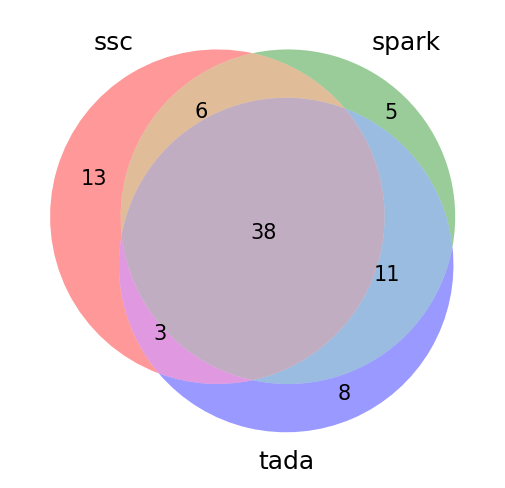

In [15]:
from matplotlib_venn import venn3, venn3_circles
ssc_str = ssc["STR"].values[:60]
spark_str = spark["STR"].values[:60]
tada_str = tada["STR"].values[:60]
plt.figure(dpi=150)
v = venn3([set(ssc_str), set(spark_str), set(tada_str)], 
      set_labels = ('ssc', 'spark', 'tada'))

In [44]:
SSC_SPATK = []
SSC_TADA = []
TADA_SPARK = []
ALL = []
slices = list(range(5,220,5))
for topN in slices:
    ssc_str = ssc["STR"].values[:topN]
    spark_str = spark["STR"].values[:topN]
    tada_str = tada["STR"].values[:topN]
    ssc_spark = len(set(ssc_str).intersection(set(spark_str)))/topN
    ssc_tada = len(set(ssc_str).intersection(set(tada_str)))/topN
    tada_spark = len(set(tada_str).intersection(set(spark_str)))/topN
    all_three = len(set(ssc_str).intersection(set(spark_str)).intersection(set(tada_str)))/topN
    SSC_SPATK.append(ssc_spark)
    SSC_TADA.append(ssc_tada)
    TADA_SPARK.append(tada_spark)
    ALL.append(all_three)

In [45]:
exp = []
for sl in slices:
    exp.append(sl**2/213/213)

In [46]:
50**2/213

11.737089201877934

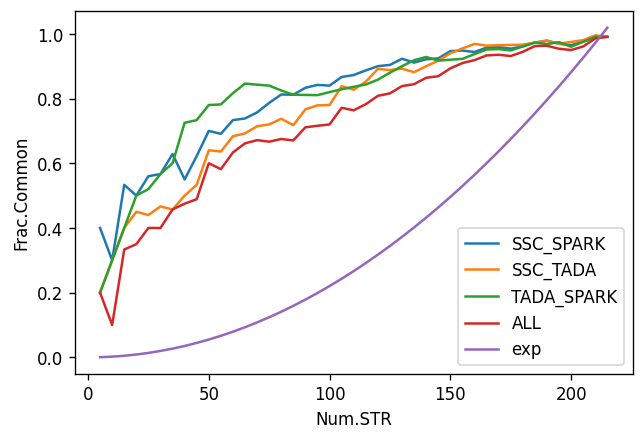

In [47]:
plt.figure(dpi=120)
plt.plot(slices, SSC_SPATK, label="SSC_SPARK")
plt.plot(slices, SSC_TADA, label="SSC_TADA")
plt.plot(slices, TADA_SPARK, label="TADA_SPARK")
plt.plot(slices, ALL, label="ALL")
plt.plot(slices, exp, label="exp")
plt.xlabel("Num.STR")
plt.ylabel("Frac.Common")
plt.legend()

In [49]:
SSC_SPATK = []
SSC_TADA = []
TADA_SPARK = []
ALL = []
slices = list(range(5,220,5))
for topN in slices:
    ssc_str = scz_gwas_qbias["STR"].values[:topN]
    spark_str = scz_denovo_qbias["STR"].values[:topN]
    tada_str = scz_psyencode_qbias["STR"].values[:topN]
    ssc_spark = len(set(ssc_str).intersection(set(spark_str)))/topN
    ssc_tada = len(set(ssc_str).intersection(set(tada_str)))/topN
    tada_spark = len(set(tada_str).intersection(set(spark_str)))/topN
    all_three = len(set(ssc_str).intersection(set(spark_str)).intersection(set(tada_str)))/topN
    SSC_SPATK.append(ssc_spark)
    SSC_TADA.append(ssc_tada)
    TADA_SPARK.append(tada_spark)
    ALL.append(all_three)

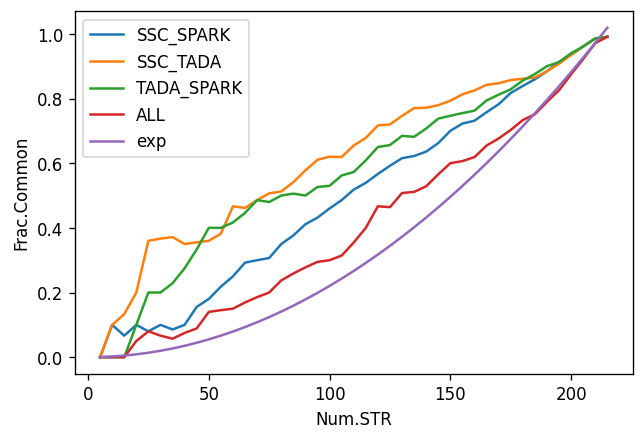

In [50]:
plt.figure(dpi=120)
plt.plot(slices, SSC_SPATK, label="GWAS_Denovo")
plt.plot(slices, SSC_TADA, label="GWAS_TADA")
plt.plot(slices, TADA_SPARK, label="TADA_SPARK")
plt.plot(slices, ALL, label="ALL")
plt.plot(slices, exp, label="exp")
plt.xlabel("Num.STR")
plt.ylabel("Frac.Common")
plt.legend()

In [35]:
def test():
    scz_gwas_qbias = pd.read_csv("dat/bias/scz.gwas.quantilescore.rank.tsv", delimiter="\t")
    scz_denovo_qbias = pd.read_csv("dat/bias/scz.denovo.quantilescore.rank.tsv", delimiter="\t")
    scz_psyencode_qbias = pd.read_csv("dat/bias/scz.psyencode.quantilescore.rank.tsv", delimiter="\t")
    asd_sib_qbias = pd.read_csv("dat/bias/asd.sib.quantilescore.rank.tsv", delimiter="\t")
    print(len(StureturesOverlap(scz_gwas_qbias, scz_denovo_qbias)))
    print(len(StureturesOverlap(scz_gwas_qbias, scz_psyencode_qbias)))
    print(len(StureturesOverlap(scz_denovo_qbias, scz_psyencode_qbias)))
    print(len(StureturesOverlap(scz_gwas_qbias, asd_sib_qbias)))
    print(len(StureturesOverlap(scz_denovo_qbias, asd_sib_qbias)))
    print(len(StureturesOverlap(scz_psyencode_qbias, asd_sib_qbias)))
    #venn3([set(lst1), set(lst2), set(lst3)], 
    #  set_labels = ('Drug A responsive genes', 'Drug B responsive genes', 'Drug C responsive genes'))
test()

9
18
20
19
21
27


In [85]:
N= 50
res = []
for i in range(100):
    B = np.random.choice(A, N, replace=False)
    C = np.random.choice(A, N, replace=False)
    inter = len( set(B).intersection(set(C)) )
    res.append(inter)
print(np.mean(res))

11.87


In [87]:
N = 50
N * N / 213

11.737089201877934

In [82]:
### Simulation
A = range(1,214,1)

exppp = []
for N in slices[:-2]:
    res = []
    for i in range(100):
        B = np.random.choice(A, N, replace=False)
        C = np.random.choice(A, N, replace=False)
        inter = len( set(B).intersection(set(C)) )
        res.append(inter)
    #print(np.mean(res))
    exppp.append(np.mean(res)/N)

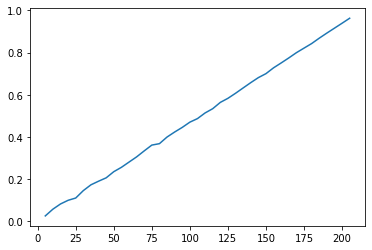

In [84]:
plt.plot(slices[:-2], exppp)

In [1]:
### brain expressed genes

BrainSpan = pd.read_csv("/Users/jiayao/Work/BrainDisorders/data/expression/brainspan/gene_matrix/expression_matrix.csv",
                   delimiter=",", header = None, names=None)
BrainSpan.head(2)

NameError: name 'pd' is not defined

In [13]:
BrainSpan_rowmeta = pd.read_csv("/Users/jiayao/Work/BrainDisorders/data/expression/brainspan/gene_matrix/rows_metadata.csv",
                               delimiter=",")

In [37]:
Brain_expressed_genes = []
Brain_expressed_exps = []
for i, row in BrainSpan.iterrows():
    try:
        entrez_id = int(BrainSpan_rowmeta.loc[i, "entrez_id"])
    except:
        continue
    avg_exp = np.mean(row[1:])
    if avg_exp > 1:
        Brain_expressed_genes.append(entrez_id)
        Brain_expressed_exps.append(avg_exp)

In [43]:
new_df = pd.DataFrame(data={"genes":Brain_expressed_genes, "exp":Brain_expressed_exps})
mouse_genes = [int(x.strip()) for x in open("/Users/jiayao/Work/ASD_Circuits/dat/allen-mouse-exp/allen-mouse-gene_entrez.txt",
                              'rt')]
new_df = new_df[new_df["genes"].isin(mouse_genes)]

In [44]:
new_df.head()

,genes,exp
0,7105,7.940634
1,8813,12.261531
2,57147,2.159583
3,2268,1.033277
4,3075,1.431010


In [46]:
brain_exp_genes = new_df["genes"].values

In [ ]:
np.sample 

In [ ]:
asd

In [110]:
# SCZ Genes
scz_genes = [int(x.strip()) for x in open("dat/scz.entrez.txt", "rt")]
# Matched Genes
con_genes = [int(x.strip()) for x in open("dat/scz.matched.null", "rt")]
con_genes = np.random.choice(con_genes, 2500) 

In [118]:
fout = open("dat/scz.matched.null.2500", 'wt')
for g in con_genes:
    #print(k,v)
    fout.write("%s\n"%(g))

In [111]:
print(scz_genes[:10])
print(con_genes[:10])

[55904, 9961, 10903, 51177, 8630, 10062, 53340, 9682, 25791, 6720]
[ 9686 27164 27245  1302  2765 55255  6195  1436  5802 27161]


In [213]:
Biases_mean = {}
Biases_median = {}
for struc in Structures:
    #bias_mean = StructureGeneListBias(struc, scz_genes, con_genes, method="mean")
    bias_median, p = StructureGeneListBias(struc, ExpZscoreMat, scz_genes, con_genes, method="median")
    #Biases_mean[struc] = bias_mean
    Biases_median[struc] = (bias_median, p)

In [216]:
# Write to file
res = sorted(Biases_median.items(), key=lambda k:k[1], reverse=True)
Fout = open("dat/scz.structures.expr.bias.rank.tsv", 'wt')
Fout.write("STR\tbias\tpvalue\n")
for k,(bias, p) in res:
    #print(k,v)
    Fout.write("%s\t%.3f\t%.3e\n"%(k, bias, p))

In [133]:
# null expression
for i in range(1000, 1001, 1):
    null_genes = [int(x.strip()) for x in open("dat/scz_match_genes/match-{}.txt".format(i), "rt")]
    Biases_median = {}
    for struc in Structures:
        bias_median, p = StructureGeneListBias(struc, ExpZscoreMat, null_genes, con_genes, method="median")
        Biases_median[struc] = bias_median
    res = sorted(Biases_median.items(), key=lambda k:k[1], reverse=True)
    fout = open("dat/scz.nulls/scz.structures.expr.bias.rank.null.{}".format(i), 'wt')
    for k,v in res:
        fout.write("%s\t%.3f\n"%(k, v))

## Decile Correlation

##### Compare scz dn correlation

In [241]:
scz_dn_r = np.mean(pd.read_csv("scz.denovo.decile.rank.tsv", delimiter="\t").head(50)["Spearmanr"])
scz_dn_r

0.5347892992167257

In [242]:
matched_corrs = []
for i in range(1, 1001, 1):
    fil_name = "dat/scz_dn_match_genes/match-{}.txt".format(i)
    genes = [int(x.strip()) for x in open(fil_name, "rt")]
    top50 = DecileCorrelation(ExpZscoreMat, genes, pdf_fil=None, csv_fil=None)
    corr = np.mean([y for (x,y,z) in top50])
    matched_corrs.append(corr)

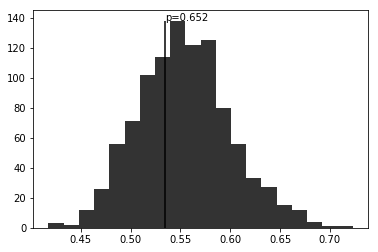

-0.4089927638317363

In [243]:
PlotPermutationP(matched_corrs, scz_dn_r)
(scz_dn_r - np.mean(matched_corrs))/np.std(matched_corrs)

##### Compare scz gwas correlation

In [251]:
scz_gwas_r = np.mean(pd.read_csv("dat/scz.gwas.decile.rank.tsv", delimiter="\t").head(50)["Spearmanr"])
scz_gwas_r

0.5931570109947645

In [252]:
matched_corrs = []
for i in range(1, 1001, 1):
    fil_name = "dat/scz_gwas_match_genes/match-{}.txt".format(i)
    genes = [int(x.strip()) for x in open(fil_name, "rt")]
    top50 = DecileCorrelation(ExpZscoreMat, genes, pdf_fil=None, csv_fil=None)
    corr = np.mean([y for (x,y,z) in top50])
    matched_corrs.append(corr)

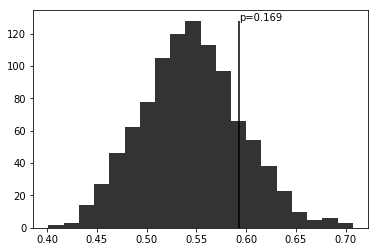

0.9632149654194644

In [253]:
PlotPermutationP(matched_corrs, scz_gwas_r)
(scz_gwas_r - np.mean(matched_corrs))/np.std(matched_corrs)

##### Compare asd ssc correlation

/Users/jiayao/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


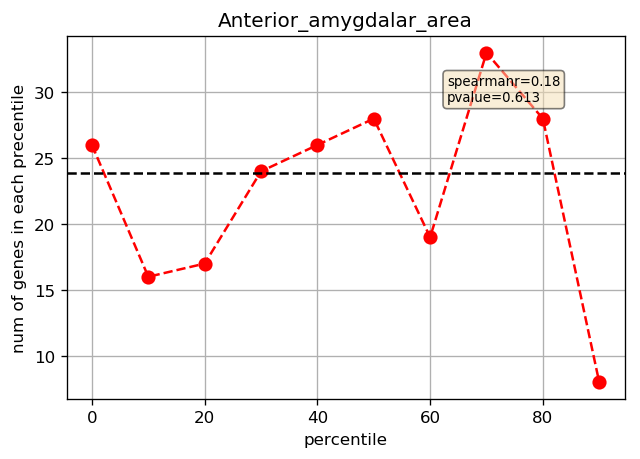

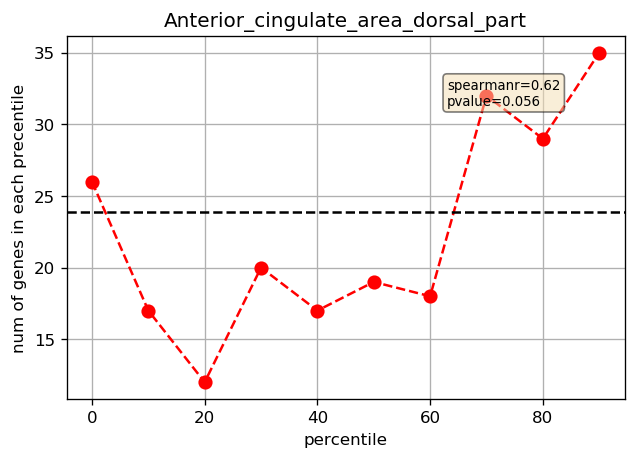

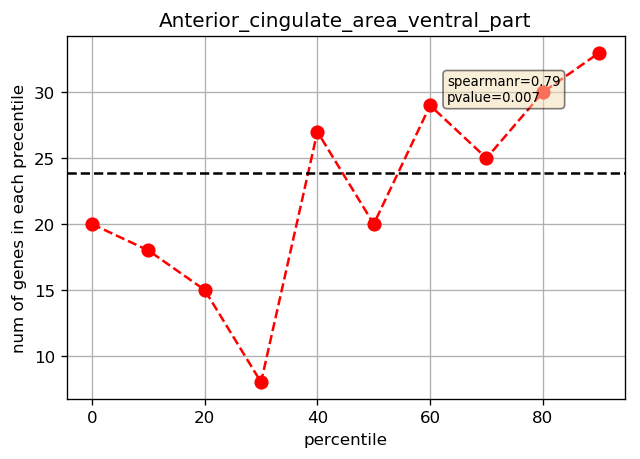

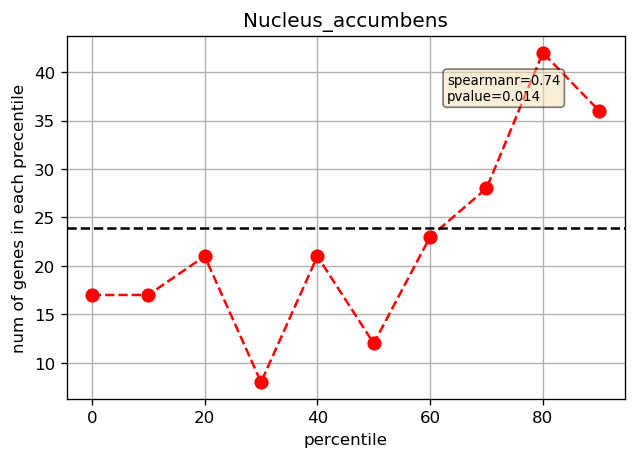

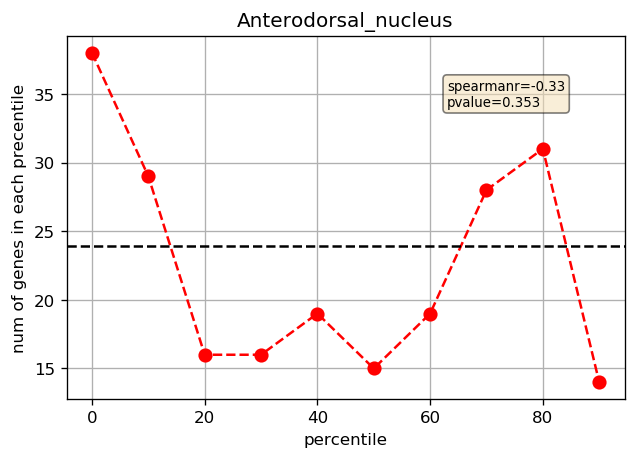

...

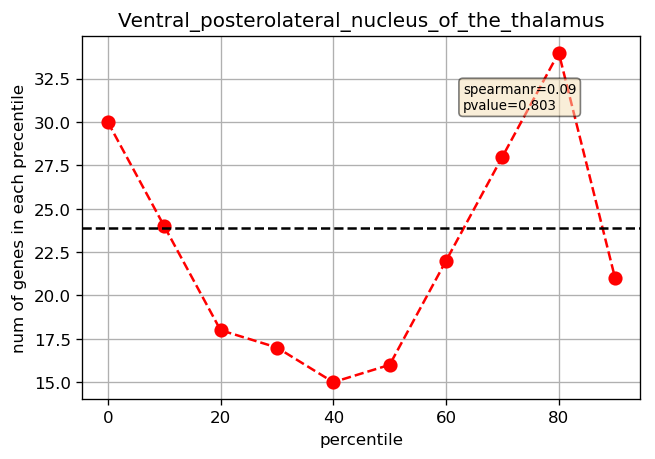

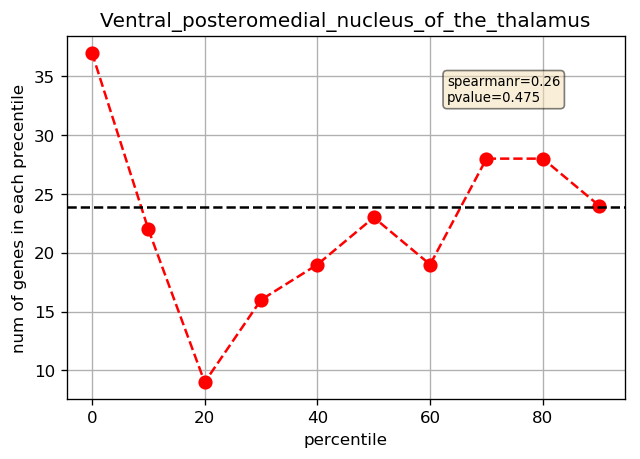

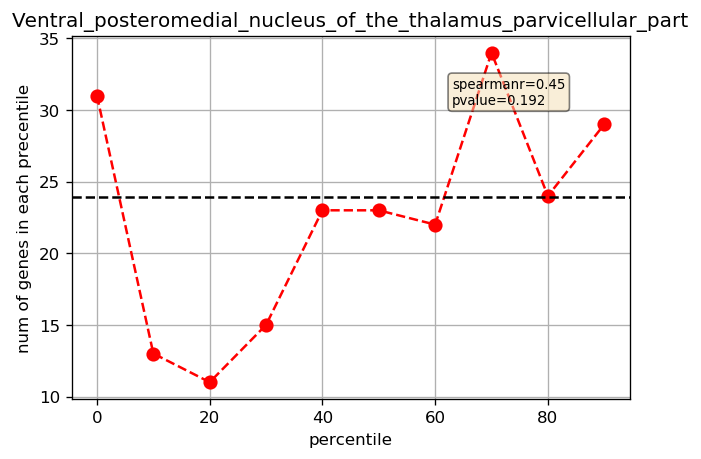

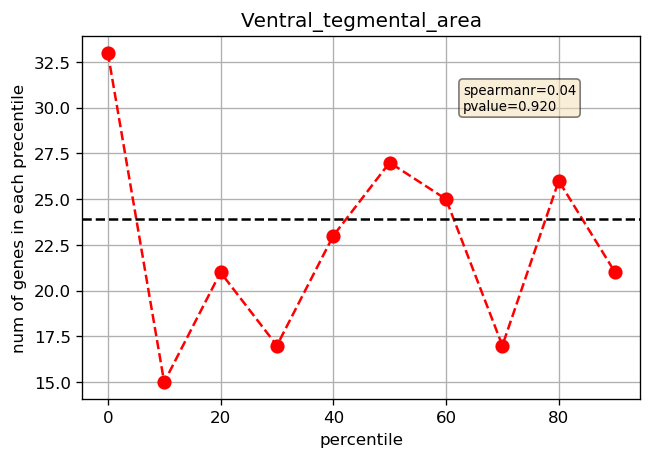

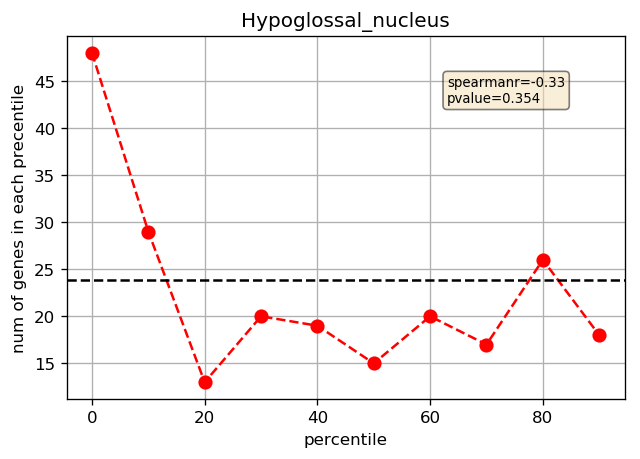

In [246]:
ASDSSC = [int(x.strip()) for x in open("../dat/genes/asd.ssc.entrez.list", "rt")]
top50 = DecileCorrelation(ExpZscoreMat, ASDSSC, 
                          pdf_fil="dat/asd.ssc.decile.pdf", csv_fil="asd.ssc.decile.rank.tsv")

In [247]:
matched_corrs = []
for i in range(1, 1001, 1):
    fil_name = "dat/asd_ssc_match_genes/match-{}.txt".format(i)
    genes = [int(x.strip()) for x in open(fil_name, "rt")]
    top50 = DecileCorrelation(ExpZscoreMat, genes, pdf_fil=None, csv_fil=None)
    corr = np.mean([y for (x,y,z) in top50])
    matched_corrs.append(corr)

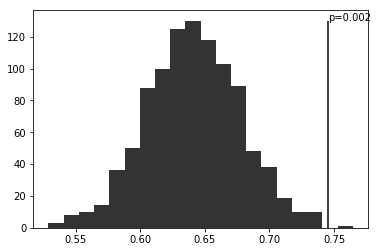

2.8185926237792085

In [248]:
asd_ssc_r = np.mean(pd.read_csv("asd.ssc.decile.rank.tsv", delimiter="\t").head(50)["Spearmanr"])
PlotPermutationP(matched_corrs, asd_ssc_r)
(asd_ssc_r - np.mean(matched_corrs))/np.std(matched_corrs)

## Compare 2 ranks

In [217]:
ExpBiasRank = pd.read_excel("dat/scz.rank.xlsx", sheet_name="ExpBiasRank")
DecileRank = pd.read_excel("dat/scz.rank.xlsx", sheet_name="DecileRank")

In [220]:
ExpBiasRankTop50 = ExpBiasRank.head(50)["STR"].values
DecileRankTop50 = DecileRank.head(50)["STR"].values

In [223]:
len(set(ExpBiasRankTop50).intersection(set(DecileRankTop50)))

35

In [277]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
asd_ssc_match = loadgenelist("../dat/genes/asd.ssc.match.cont.list")
ComputeExpressionBias("zscore", ExpZscoreMat, asd_ssc, asd_ssc_match, outfil="dat/asd.ssc_vs_match.str.rank.tsv")

In [278]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
asd_sib = loadgenelist("../dat/genes/asd.sib.entrez.list")
asd_sib_match = loadgenelist("../dat/genes/asd.sib.match.cont.list")
ComputeExpressionBias("zscore", ExpZscoreMat, asd_sib, asd_sib_match, outfil="dat/asd.sib_vs_match.str.rank.tsv")

In [286]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
asd_sib_lgd = loadgenelist("../dat/genes/asd.sib.lgd.list")
asd_sib_lgd_match = loadgenelist("../dat/genes/asd.siblgd.match.cont.list")
ComputeExpressionBias("zscore", ExpZscoreMat, asd_sib_lgd, asd_sib_lgd_match, outfil="dat/asd.siblgd_vs_match.str.rank.tsv")

In [279]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
asd_ssc = loadgenelist("../dat/genes/asd.spark.entrez.list")
asd_ssc_match = loadgenelist("../dat/genes/asd.spark.match.cont.list")
ComputeExpressionBias("zscore", ExpZscoreMat, asd_ssc, asd_ssc_match, outfil="dat/asd.spark_vs_match.str.rank.tsv")

In [284]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
asd_ssc = loadgenelist("../dat/genes/asd.tada.entrez.list")
asd_ssc_match = loadgenelist("../dat/genes/asd.tada.match.cont.list")
ComputeExpressionBias("zscore", ExpZscoreMat, asd_ssc, asd_ssc_match, outfil="dat/asd.tada_vs_match.str.rank.tsv")

###### Test: Zscore of ASD and Sibling LGD, top 50 structures which is more bias

In [329]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
ZscoreMat = pd.read_csv(ExpZscoreMat, index_col="ROW")
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
asd_sib_lgd = loadgenelist("../dat/genes/asd.sib.lgd.list")
Structures = list(ZscoreMat.columns.values)
asd_str_z = {}; sib_lgd_str_z = {}
for struc in Structures:
    Case_Values = []; Control_Values = [];
    for entrez_id in asd_ssc:
        try:
            v = ZscoreMat.loc[entrez_id, struc]
            if v == v:
                Case_Values.append(v)
        except:
            pass
    for entrez_id in asd_sib_lgd:
        v = ZscoreMat.loc[entrez_id, struc]
        if v == v:
            Control_Values.append(v)
    asd_str_z[struc] = np.mean(Case_Values)
    sib_lgd_str_z[struc] = np.mean(Control_Values)

In [330]:
asd_rank = sorted(asd_str_z.items(), key=lambda x:x[1], reverse=True)
sib_lgd_rank = sorted(sib_lgd_str_z.items(), key=lambda x:x[1], reverse=True)

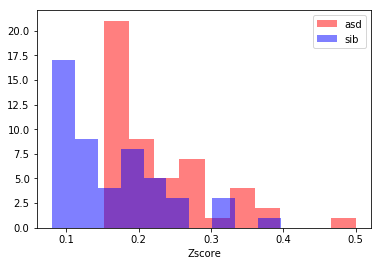

In [331]:
plt.hist([x[1] for x in asd_rank[:50]], color="red", label="asd", alpha=.5)
plt.hist([x[1] for x in sib_lgd_rank[:50]], color="blue", label="sib", alpha=.5)
plt.xlabel("Zscore")
plt.legend()
plt.show()

In [317]:
t, p = scipy.stats.mannwhitneyu([x[1] for x in asd_rank[:50]], [x[1] for x in sib_rank[:50]], alternative='greater')

p

1.2457357535919265e-05

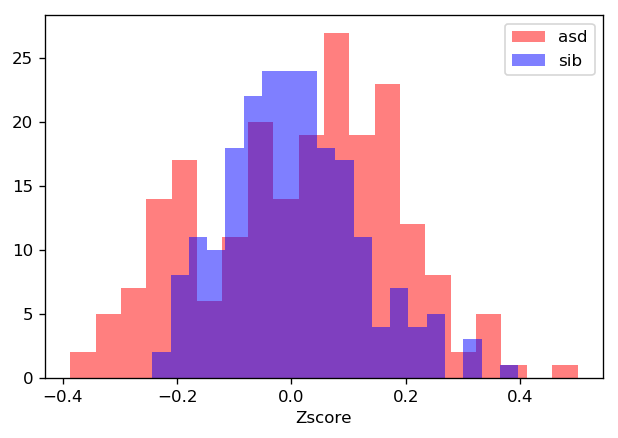

In [318]:
fig = plt.figure(dpi=120)
plt.hist([x[1] for x in asd_rank], color="red", label="asd", bins=20, alpha=.5)
plt.hist([x[1] for x in sib_rank], color="blue", label="sib", bins=20, alpha=.5)
plt.xlabel("Zscore")
plt.legend()
plt.show()

In [346]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
ZscoreMat = pd.read_csv(ExpZscoreMat, index_col="ROW")
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
asd_sib_lgd = loadgenelist("../dat/genes/asd.sib.entrez.list")
Structures = list(ZscoreMat.columns.values)
asd_str_z = {}; sib_str_z = {}
for struc in Structures:
    Case_Values = []; Control_Values = [];
    for entrez_id in asd_ssc:
        try:
            v = ZscoreMat.loc[entrez_id, struc]
            if v == v:
                Case_Values.append(v)
        except:
            pass
    for entrez_id in asd_sib_lgd:
        try:
            v = ZscoreMat.loc[entrez_id, struc]
            if v == v:
                Control_Values.append(v)
        except:
            pass
    asd_str_z[struc] = np.mean(Case_Values)
    sib_str_z[struc] = np.mean(Control_Values)

In [347]:
asd_rank = sorted(asd_str_z.items(), key=lambda x:x[1], reverse=True)
sib_rank = sorted(sib_str_z.items(), key=lambda x:x[1], reverse=True)

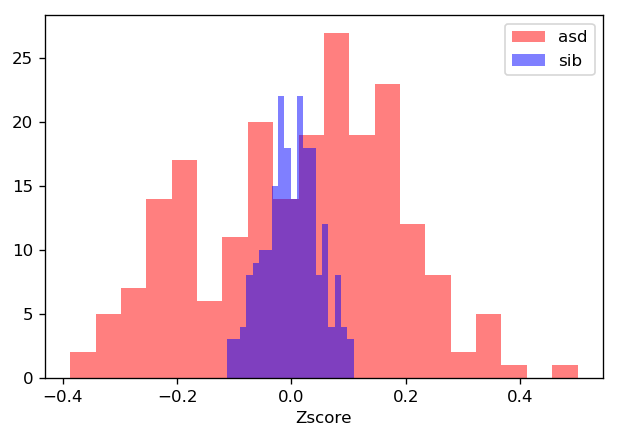

0.047335247981414655


In [354]:
fig = plt.figure(dpi=120)
plt.hist([x[1] for x in asd_rank], color="red", label="asd", bins=20, alpha=.5)
plt.hist([x[1] for x in sib_rank], color="blue", label="sib", bins=20, alpha=.5)
plt.xlabel("Zscore")
plt.legend()
plt.show()
print(np.std([x[1] for x in sib_rank]))

In [326]:
ExpZscoreMat = "../dat/allen-mouse-exp/energy-zscore-conn-model.csv"
ZscoreMat = pd.read_csv(ExpZscoreMat, index_col="ROW")
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
asd_sib_lgd = loadgenelist("../dat/genes/asd.sib.entrez.list")
Structures = list(ZscoreMat.columns.values)
Npermute = 1000
sib_rank_permute = []
for i in range(Npermute):  
    _asd_sib_lgd = np.random.choice(asd_sib_lgd, 160)
    sib_str_z = {}
    for struc in Structures:
        Case_Values = []; Control_Values = [];
        for entrez_id in _asd_sib_lgd:
            try:
                v = ZscoreMat.loc[entrez_id, struc]
                if v == v:
                    Control_Values.append(v)
            except:
                pass
        sib_str_z[struc] = np.mean(Control_Values)
    sib_rank = sorted(sib_str_z.items(), key=lambda x:x[1], reverse=True)
    sib_rank = [x[1] for x in sib_rank]
    sib_rank_permute.append( [np.mean(sib_rank[:50]), np.std(sib_rank)] )

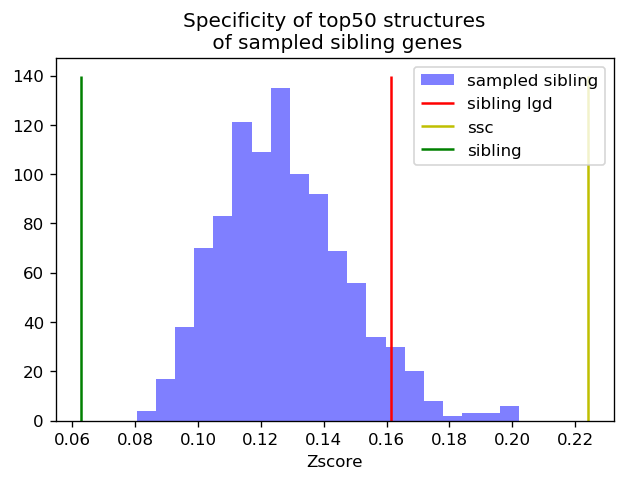

In [352]:
fig = plt.figure(dpi=120)
#plt.hist([x[1] for x in asd_rank], color="red", label="asd", bins=20, alpha=.5)
plt.title("Specificity of top50 structures\n of sampled sibling genes")
plt.hist([x[0] for x in sib_rank_permute], color="blue", label="sampled sibling", bins=20, alpha=.5)
plt.vlines(x=np.mean([x[1] for x in sib_lgd_rank[:50]]), ymin=0, ymax=140, color = "red", label="sibling lgd")
plt.vlines(x=np.mean([x[1] for x in asd_rank[:50]]), ymin=0, ymax=140, color = "y", label="ssc")
plt.vlines(x=np.mean([x[1] for x in sib_rank[:50]]), ymin=0, ymax=140, color = "g", label="sibling")
plt.xlabel("Zscore")
plt.legend()
plt.show()

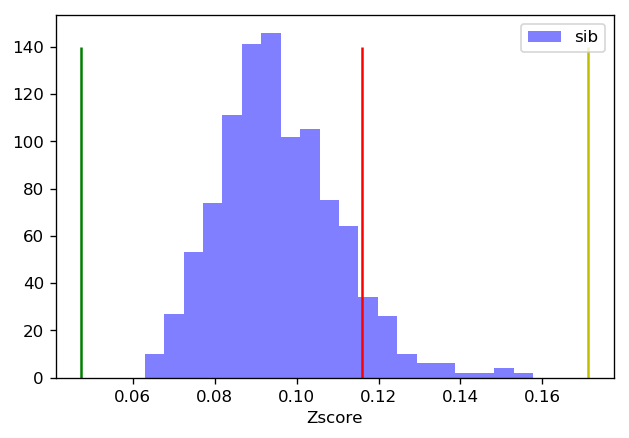

In [350]:
fig = plt.figure(dpi=120)
#plt.hist([x[1] for x in asd_rank], color="red", label="asd", bins=20, alpha=.5)
plt.hist([x[1] for x in sib_rank_permute], color="blue", label="sib", bins=20, alpha=.5)
plt.vlines(x=np.std([x[1] for x in sib_lgd_rank]), ymin=0, ymax=140, color = "red")
plt.vlines(x=np.std([x[1] for x in asd_rank]), ymin=0, ymax=140, color = "y")
plt.vlines(x=np.std([x[1] for x in sib_rank]), ymin=0, ymax=140, color = "g")
plt.xlabel("Zscore")
plt.legend()
plt.show()

In [398]:
Weights = list(range(-5,0,1)) + list(range(1,6,1))
#print(len(Weights), Weights)
NullScores = DecileNull(220, 10, 10000, Weights)

In [399]:
#NullScores

(array([  16.,  126.,  649., 1558., 2569., 2647., 1635.,  631.,  149.,
          20.]),
 array([-0.8       , -0.64045455, -0.48090909, -0.32136364, -0.16181818,
        -0.00227273,  0.15727273,  0.31681818,  0.47636364,  0.63590909,
         0.79545455]),
 <a list of 10 Patch objects>)

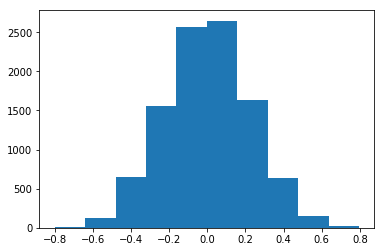

In [400]:
plt.hist(NullScores)

In [401]:
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
percentile_slices = np.array(range(0, 100, 10))
DecileOneSTR("Perirhinal_area", ZscoreMat, asd_ssc, Weights, percentile_slices)

1.3333333333333333

In [402]:
DecileRankScoring(ZscoreMat, asd_ssc, Weights, NullScores, percentile_slices, csv_fil="asd.weightscore.rank.tsv")

In [455]:
asd_spark = loadgenelist("../dat/genes/asd.spark.entrez.list")
asd_tada = loadgenelist("../dat/genes/asd.tada.entrez.list")
#DecileRankScoring(ZscoreMat, asd_spark, Weights, NullScores, percentile_slices, csv_fil="asd.spark.weightscore.rank.tsv")
#DecileRankScoring(ZscoreMat, asd_tada, Weights, NullScores, percentile_slices, csv_fil="asd.tada.weightscore.rank.tsv")
DecileCorrelation(ZscoreMat, asd_spark, 
                          pdf_fil=None, csv_fil="asd.spark.decile.rank.tsv")
DecileCorrelation(ZscoreMat, asd_tada, 
                          pdf_fil=None, csv_fil="asd.tada.decile.rank.tsv")

[['Anterior_cingulate_area_ventral_part',
  0.811336062533567,
  0.004383959648740885],
 ['Gustatory_areas', 0.7951404970357048, 0.0059682273636222595],
 ['Lateral_posterior_nucleus_of_the_thalamus',
  0.7659609850368815,
  0.00978703990340832],
 ['Nucleus_accumbens', 0.7598819296000807, 0.010758005132716318],
 ['Parasubiculum', 0.743916268649307, 0.013627561508064353],
 ['Superior_colliculus_sensory_related',
  0.737818594316116,
  0.01485220587899062],
 ['Retrosplenial_area_ventral_part', 0.735565707852878, 0.01532345637780498],
 ['Agranular_insular_area_ventral_part',
  0.7055745870108261,
  0.022625592848361013],
 ['Anterior_pretectal_nucleus', 0.6930123197952736, 0.02629287817880513],
 ['Anterior_olfactory_nucleus', 0.6829395253173965, 0.0295125778506635],
 ['Ventral_posteromedial_nucleus_of_the_thalamus',
  0.6791288043619165,
  0.030797641286058292],
 ['Inferior_colliculus_external_nucleus',
  0.6775189128088568,
  0.03135179442335338],
 ['Inferior_colliculus_central_nucleus',
 

In [404]:
asd_sib_lgd = loadgenelist("../dat/genes/asd.sib.lgd.list")
DecileRankScoring(ZscoreMat, asd_sib_lgd, Weights, NullScores, percentile_slices, 
                  csv_fil="asd.siglgd.weightscore.rank.tsv")

In [456]:
asd_sib = loadgenelist("../dat/genes/asd.sib.entrez.list")
DecileRankScoring(ZscoreMat, asd_sib, Weights, NullScores, percentile_slices, 
                  csv_fil="asd.sib.weightscore.rank.tsv")
DecileCorrelation(ZscoreMat, asd_sib, 
                          pdf_fil=None, csv_fil="asd.sib.decile.rank.tsv")

[['Subparafascicular_area', 0.9118583155200968, 0.0002371436370050654],
 ['Anteromedial_nucleus_dorsal_part',
  0.8787878787878788,
  0.0008138621117322101],
 ['Lateral_habenula', 0.8545454545454544, 0.0016368033159867143],
 ['Mediodorsal_nucleus_of_thalamus',
  0.8449887057152898,
  0.0020857965053342974],
 ['Medial_geniculate_complex_dorsal_part',
  0.8124038404635959,
  0.004291450003001632],
 ['Anterior_pretectal_nucleus', 0.8109906863144085, 0.004414185067148126],
 ['Postsubiculum', 0.8060606060606059, 0.004862061101964606],
 ['Lateral_posterior_nucleus_of_the_thalamus',
  0.7939393939393938,
  0.0060999233136969115],
 ['Dorsal_part_of_the_lateral_geniculate_complex',
  0.7696969696969697,
  0.009221952722215994],
 ['Medial_geniculate_complex_ventral_part',
  0.7659609850368815,
  0.00978703990340832],
 ['Nucleus_of_the_optic_tract', 0.7477238187264795, 0.012899731006897746],
 ['Primary_somatosensory_area_upper_limb',
  0.7477238187264795,
  0.012899731006897746],
 ['Parafascicula

In [413]:
# Bias Dist
ssc = pd.read_csv("asd.weightscore.rank.tsv", delimiter="\t")
sib = pd.read_csv("asd.sib.weightscore.rank.tsv", delimiter="\t")
siblgd = pd.read_csv("asd.siglgd.weightscore.rank.tsv", delimiter="\t")
spark = pd.read_csv("asd.spark.weightscore.rank.tsv", delimiter="\t")
tada = pd.read_csv("asd.tada.weightscore.rank.tsv", delimiter="\t")

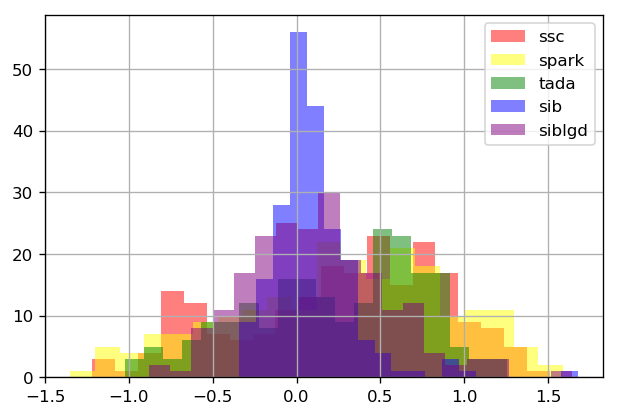

In [420]:
fig = plt.figure(dpi=120)
plt.hist(ssc["Score"].values, color="red", bins=20, alpha=0.5, label="ssc")
plt.hist(spark["Score"].values, color="yellow", bins=20, alpha=0.5, label="spark")
plt.hist(tada["Score"].values, color="green", bins=20, alpha=0.5, label="tada")
plt.hist(sib["Score"].values, color="blue", bins=20, alpha=0.5, label="sib")
plt.hist(siblgd["Score"].values, color="purple", bins=20, alpha=0.5, label="siblgd")
plt.legend()
plt.grid(True)
plt.show()

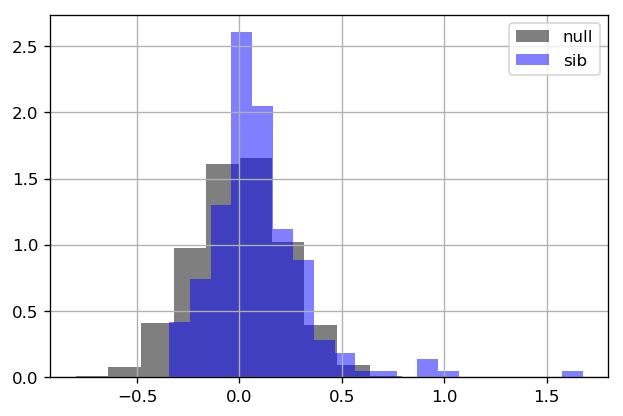

0.39993248945147675 0.637 0.9999999999359268


In [440]:
fig = plt.figure(dpi=120)
plt.hist(NullScores, label="null", color="black", alpha=0.5, density=1)
plt.hist(sib["Score"].values, color="blue", bins=20, alpha=0.5, label="sib", density=1)
plt.legend()
plt.grid(True)
plt.show()
Case_Values = sorted(NullScores, reverse=True)[:50]
Control_Values = sorted(sib["Score"].values, reverse=True)[:50]
t, p = scipy.stats.mannwhitneyu(Control_Values, Case_Values, alternative='greater')
print(np.mean(Control_Values), np.mean(Case_Values), p)

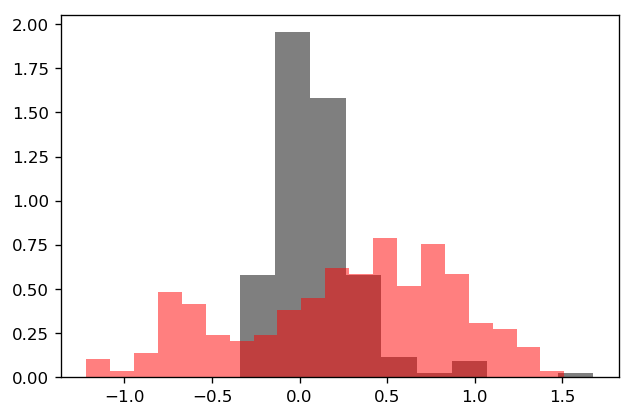

1.0037333333333331 0.39993248945147675 7.732547083116172e-15


In [438]:
fig = plt.figure(dpi=120)
plt.hist(sib["Score"].values, label="null", color="black", alpha=0.5, density=1)
plt.hist(ssc["Score"].values, color="red", bins=20, alpha=0.5, label="sib", density=1)
plt.show()
Case_Values = sorted(ssc["Score"].values, reverse=True)[:50]
Control_Values = sorted(sib["Score"].values, reverse=True)[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

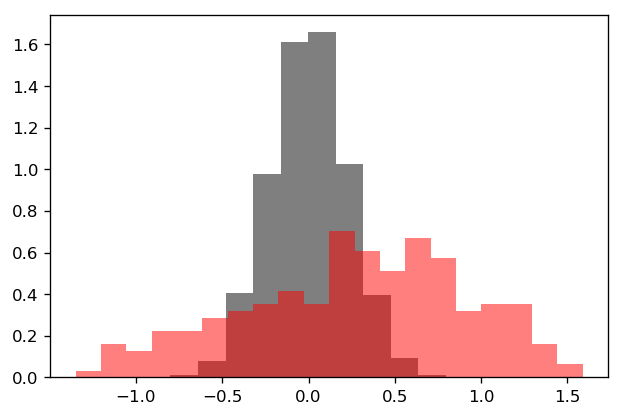

1.053111111111111 0.39993248945147675 3.0763215299421146e-15


In [441]:
fig = plt.figure(dpi=120)
plt.hist(NullScores, label="null", color="black", alpha=0.5, density=1)
plt.hist(spark["Score"].values, color="red", bins=20, alpha=0.5, label="sib", density=1)
plt.show()
Case_Values = sorted(spark["Score"].values, reverse=True)[:50]
Control_Values = sorted(sib["Score"].values, reverse=True)[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

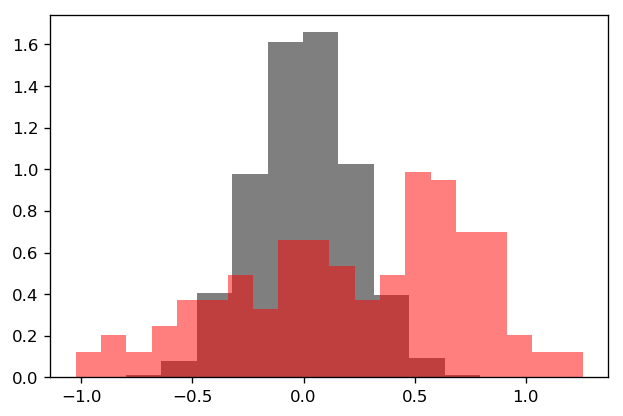

0.8396581196581197 0.39993248945147675 7.73636137245448e-13


In [442]:
fig = plt.figure(dpi=120)
plt.hist(NullScores, label="null", color="black", alpha=0.5, density=1)
plt.hist(tada["Score"].values, color="red", bins=20, alpha=0.5, label="sib", density=1)
plt.show()
Case_Values = sorted(tada["Score"].values, reverse=True)[:50]
Control_Values = sorted(sib["Score"].values, reverse=True)[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

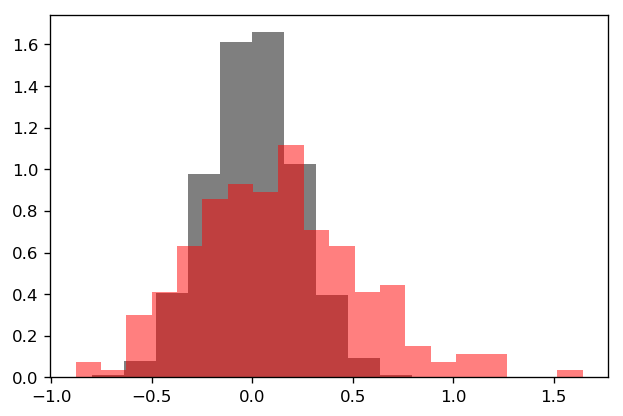

0.6935443037974683 0.39993248945147675 2.402510616809867e-10


In [446]:
fig = plt.figure(dpi=120)
plt.hist(NullScores, label="null", color="black", alpha=0.5, density=1)
plt.hist(siblgd["Score"].values, color="red", bins=20, alpha=0.5, label="sib", density=1)
plt.show()
Case_Values = sorted(siblgd["Score"].values, reverse=True)[:50]
Control_Values = sorted(sib["Score"].values, reverse=True)[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

In [465]:
# Bias Dist
ssc = pd.read_csv("asd.weightscore.rank.tsv", delimiter="\t")
sib = pd.read_csv("asd.sib.weightscore.rank.tsv", delimiter="\t")
siblgd = pd.read_csv("asd.siglgd.weightscore.rank.tsv", delimiter="\t")
spark = pd.read_csv("asd.spark.weightscore.rank.tsv", delimiter="\t")
tada = pd.read_csv("asd.tada.weightscore.rank.tsv", delimiter="\t")

ssc2 = pd.read_csv("asd.ssc.decile.rank.tsv", delimiter="\t")
sib2 = pd.read_csv("asd.sib.decile.rank.tsv", delimiter="\t")
#siblgd2 = pd.read_csv("asd.siglgd.decile.rank.tsv", delimiter="\t")
spark2 = pd.read_csv("asd.spark.decile.rank.tsv", delimiter="\t")
tada2 = pd.read_csv("asd.tada.decile.rank.tsv", delimiter="\t")

print(len(StureturesOverlap(ssc, spark)))
print(len(StureturesOverlap(ssc, tada)))
print(len(StureturesOverlap(spark, tada)))
print(len(StureturesOverlap(ssc, sib)))
print(len(StureturesOverlap(spark, sib)))
print(len(StureturesOverlap(tada, sib)))
print()
print(len(StureturesOverlap(ssc, ssc2)))
print(len(StureturesOverlap(spark, spark2)))
print(len(StureturesOverlap(tada, tada2)))

32
27
26
19
11
18

39
40
37


In [460]:
# Bias Dist
def test():
    ssc = pd.read_csv("asd.ssc.decile.rank.tsv", delimiter="\t")
    sib = pd.read_csv("asd.sib.decile.rank.tsv", delimiter="\t")
    #siblgd = pd.read_csv("asd.siglgd.decile.rank.tsv", delimiter="\t")
    spark = pd.read_csv("asd.spark.decile.rank.tsv", delimiter="\t")
    tada = pd.read_csv("asd.tada.decile.rank.tsv", delimiter="\t")
    print(len(StureturesOverlap(ssc, spark)))
    print(len(StureturesOverlap(ssc, tada)))
    print(len(StureturesOverlap(spark, tada)))
    print(len(StureturesOverlap(ssc, sib)))
    print(len(StureturesOverlap(spark, sib)))
    print(len(StureturesOverlap(tada, sib)))
test()

34
28
25
18
12
13


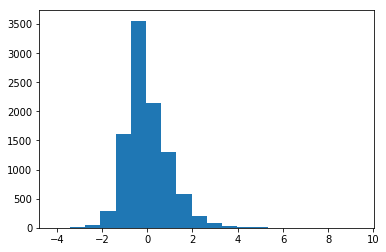

In [445]:
plt.hist(ZscoreMat["Perirhinal_area"].values, bins=20)
plt.show()

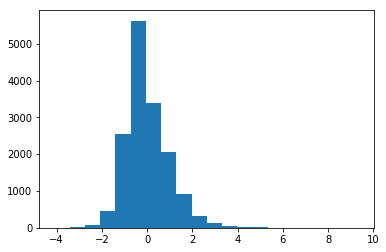

In [447]:
plt.hist(ZscoreMat["Caudoputamen"].values, bins=20)
plt.show()

### Quantile AVG

In [547]:
asd_ssc = loadgenelist("../dat/genes/asd.ssc.entrez.list")
asd_spark = loadgenelist("../dat/genes/asd.spark.entrez.list")
asd_tada = loadgenelist("../dat/genes/asd.tada.list")
asd_sib = loadgenelist("../dat/genes/asd.sib.entrez.list")
asd_siblgd = loadgenelist("../dat/genes/asd.sib.lgd.list")

In [548]:
QuantileAVGScoring(ZscoreMat, asd_ssc,
                  csv_fil="asd.ssc.quantilescore.rank.tsv")
QuantileAVGScoring(ZscoreMat, asd_spark,
                  csv_fil="asd.spark.quantilescore.rank.tsv")
QuantileAVGScoring(ZscoreMat, asd_tada,
                  csv_fil="asd.tada.quantilescore.rank.tsv")

In [549]:
QuantileAVGScoring(ZscoreMat, asd_sib, 
                  csv_fil="asd.sib.quantilescore.rank.tsv")
QuantileAVGScoring(ZscoreMat, asd_sib_lgd, 
                  csv_fil="asd.siblgd.quantilescore.rank.tsv")

In [3]:
# Bias Dist
ssc = pd.read_csv("dat/bias/asd.ssc.quantilescore.rank.tsv", delimiter="\t")
sib = pd.read_csv("dat/bias/asd.sib.quantilescore.rank.tsv", delimiter="\t")
siblgd = pd.read_csv("dat/bias/asd.siblgd.quantilescore.rank.tsv", delimiter="\t")
spark = pd.read_csv("dat/bias/asd.spark.quantilescore.rank.tsv", delimiter="\t")
tada = pd.read_csv("dat/bias/asd.tada.quantilescore.rank.tsv", delimiter="\t")

       asd_ssc_qbias	0.582	0.519	0.064	3.533e-18
     asd_spark_qbias	0.589	0.519	0.071	3.533e-18
      asd_tada_qbias	0.585	0.519	0.067	3.533e-18


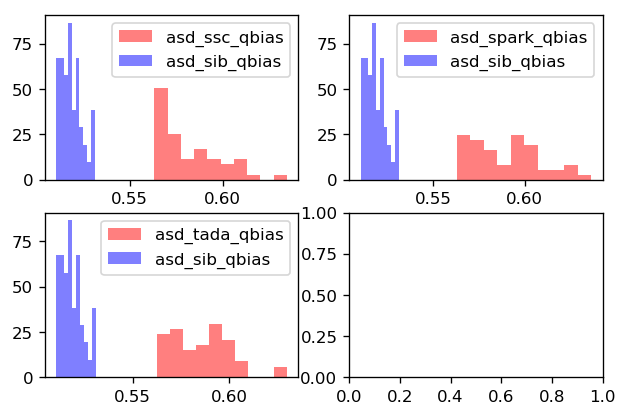

In [14]:
PlotBiasDistandP(ssc, spark, tada, sib,
                labels=["asd_ssc_qbias", "asd_spark_qbias", "asd_tada_qbias", "asd_sib_qbias"])

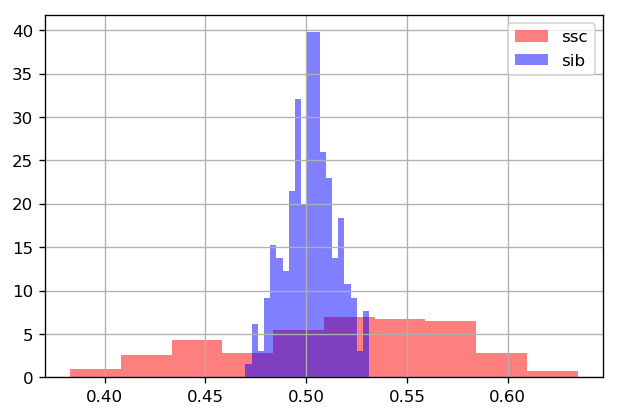

0.582099303753643 0.5185332824141242 3.533035965194466e-18


In [551]:
fig = plt.figure(dpi=120)
plt.hist(ssc["Score"].values, label="ssc", color="red", alpha=0.5, density=1)
plt.hist(sib["Score"].values, color="blue", bins=20, alpha=0.5, label="sib", density=1)
plt.legend()
plt.grid(True)
plt.show()
Case_Values = ssc["Score"].values[:50]
Control_Values = sib["Score"].values[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

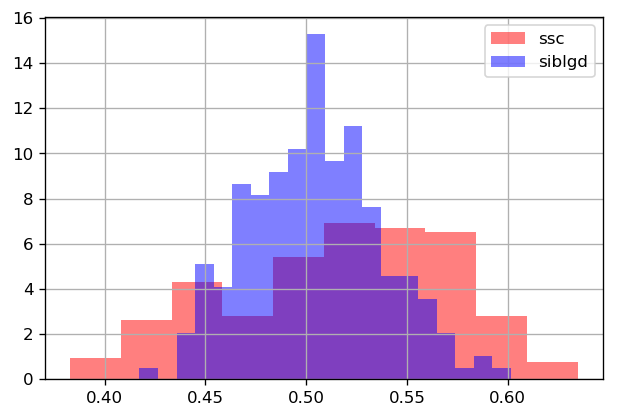

0.582099303753643 0.5477321997747475 1.3268345598468616e-13


In [552]:
fig = plt.figure(dpi=120)
plt.hist(ssc["Score"], label="ssc", color="red", alpha=0.5, density=1)
plt.hist(siblgd["Score"], color="blue", bins=20, alpha=0.5, label="siblgd", density=1)
plt.legend()
plt.grid(True)
plt.show()
Case_Values = ssc["Score"].values[:50]
Control_Values = siblgd["Score"].values[:50]
t, p = scipy.stats.mannwhitneyu(Case_Values, Control_Values, alternative='greater')
print(np.mean(Case_Values), np.mean(Control_Values), p)

In [553]:
# Bias Dist
def test():
    ssc = pd.read_csv("asd.ssc.quantilescore.rank.tsv", delimiter="\t")
    sib = pd.read_csv("asd.sib.quantilescore.rank.tsv", delimiter="\t")
    siblgd = pd.read_csv("asd.siblgd.quantilescore.rank.tsv", delimiter="\t")
    spark = pd.read_csv("asd.spark.quantilescore.rank.tsv", delimiter="\t")
    tada = pd.read_csv("asd.tada.quantilescore.rank.tsv", delimiter="\t")
    print(len(StureturesOverlap(ssc, spark)))
    print(len(StureturesOverlap(ssc, tada)))
    print(len(StureturesOverlap(spark, tada)))
    print(len(StureturesOverlap(ssc, sib)))
    print(len(StureturesOverlap(spark, sib)))
    print(len(StureturesOverlap(tada, sib)))
test()

35
32
39
20
14
18


ssc	0.582	0.548	1.327e-13
spark	0.589	0.548	7.354e-15
tada	0.585	0.548	1.399e-14


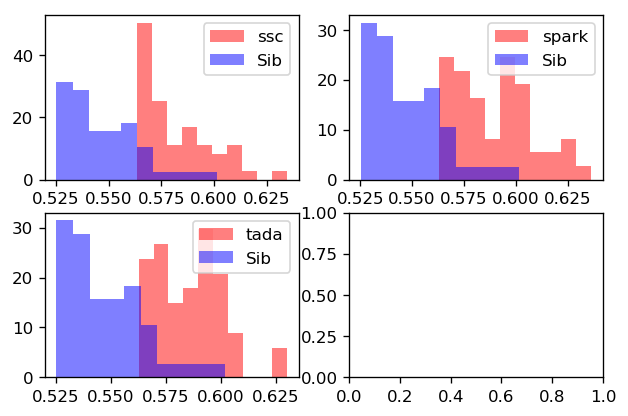

In [562]:
PlotBiasDistandP(ssc, spark, tada, siblgd)

In [584]:
Jon = pd.read_csv("../exp-1.csv", index_col="LABEL")
JW = pd.read_csv("asd.ssc.quantilescore.rank.tsv", delimiter="\t", index_col="STR")

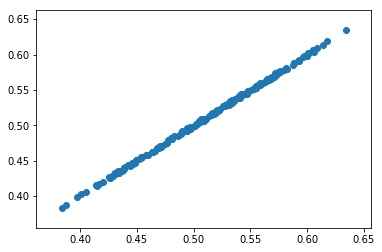

In [585]:
s1 = []
s2 = []
for STR in JW.index:
    s1.append(Jon.loc[STR, "SCORE"])
    s2.append(JW.loc[STR, "Score"])
plt.scatter(s1, s2)
plt.show()

In [591]:
Jontop50 = set(Jon.head(50).index)
JWtop50 = set(JW.head(50).index)
print(len(Jontop50.intersection(JWtop50)))
print(Jontop50.difference(JWtop50), JWtop50.difference(Jontop50))

49
{'Medial_habenula'} {'Subiculum_ventral_part'}


In [593]:
Jon = pd.read_csv("../exp-2.csv", index_col="LABEL")
JW = pd.read_csv("asd.sib.quantilescore.rank.tsv", delimiter="\t", index_col="STR")

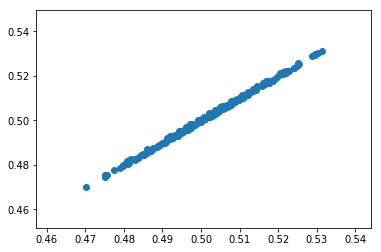

48
{'Pyramus_VIII', 'Peripeduncular_nucleus'} {'Temporal_association_areas', 'Olfactory_tubercle'}


In [594]:
s1 = []
s2 = []
for STR in JW.index:
    s1.append(Jon.loc[STR, "SCORE"])
    s2.append(JW.loc[STR, "Score"])
plt.scatter(s1, s2)
plt.show()
Jontop50 = set(Jon.head(50).index)
JWtop50 = set(JW.head(50).index)
print(len(Jontop50.intersection(JWtop50)))
print(Jontop50.difference(JWtop50), JWtop50.difference(Jontop50))

## Sampling/Matching

In [302]:
ExpMat = pd.read_csv("../dat/allen-mouse-exp/energy-conn-model.csv", index_col="ROW")
ExpMat.head(2)

,Anterior_amygdalar_area,Anterior_cingulate_area_dorsal_part,Anterior_cingulate_area_ventral_part,Nucleus_accumbens,Anterodorsal_nucleus,Anterior_hypothalamic_nucleus,Agranular_insular_area_dorsal_part,Agranular_insular_area_posterior_part,Agranular_insular_area_ventral_part,Nucleus_ambiguus,...,Primary_visual_area,Posterolateral_visual_area,posteromedial_visual_area,Ventral_medial_nucleus_of_the_thalamus,Ventromedial_hypothalamic_nucleus,Ventral_posterolateral_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus,Ventral_posteromedial_nucleus_of_the_thalamus_parvicellular_part,Ventral_tegmental_area,Hypoglossal_nucleus
ROW,,,,,,,,,,,,,,,,,,,,,
1,0.089402,0.060138,0.050112,0.023204,0.034093,0.088305,0.036078,NaN,0.046813,0.032990,...,0.035584,0.179587,0.021418,0.030367,0.115622,0.036984,0.053407,0.033779,0.110354,0.134065
2,0.040017,0.014211,0.023246,0.024009,0.403265,0.025202,0.354581,0.058713,0.145883,0.022381,...,0.043141,0.005781,0.213674,0.052746,0.038968,0.016603,0.018719,0.035381,0.122850,1.065840


In [329]:
# SSC
Dir = "dat/Match/asd_ssc_match_genes"
STRs = ExpMat.columns.values
STR_Z = {}
for STR in STRs:
    STR_Z[STR] = []
Genes = []
for f in os.listdir(Dir):
    gene = int(f.split(".")[0])
    Genes.append(gene)
    matched_genes = loadgenelist("%s/%s"%(Dir, f))
    tmpExpMat = ExpMat.loc[matched_genes, :]
    
    for STR in STRs:
        exp = ExpMat.loc[gene,STR]
        exps = tmpExpMat[STR].values
        exps = [x for x in exps if x==x]
        z = (exp - np.mean(exps)) / np.std(exps)
        STR_Z[STR].append(z)

In [330]:
df = pd.DataFrame(STR_Z)
df.index = Genes
df = df.transpose()

In [333]:
df.head(10)

,10075,10438,10497,10522,10575,10716,10771,10787,1106,11069,...,9620,9665,9672,9690,9901,9919,9950,9969,9994,Bias
Anterior_amygdalar_area,0.543044,-0.050469,-1.023241,0.246509,0.485301,-1.239328,0.090179,-0.546829,-0.041696,-0.159042,...,-0.108316,0.494870,-0.354523,-1.205899,0.339231,0.357628,-0.704243,-0.966399,-0.557420,-0.170957
Anterior_cingulate_area_dorsal_part,-0.598570,0.776660,1.942560,0.188705,0.516617,2.927383,0.670822,1.426251,-0.492259,0.482127,...,-0.809367,-0.970211,-0.282792,0.439058,0.499932,-1.061735,0.070201,0.225658,-0.467683,0.102725
Anterior_cingulate_area_ventral_part,-1.158541,3.622251,1.507425,0.011458,-0.349426,3.997226,1.104307,0.817885,-0.422380,0.897479,...,-0.772761,-0.863019,-0.451681,0.903347,0.431919,-1.181113,0.492683,0.282624,-0.638467,0.109009
Nucleus_accumbens,-0.308286,0.016527,-0.113064,0.335174,-0.139365,0.123343,1.909896,0.159070,-0.201679,0.016175,...,-0.562500,0.055965,-1.125867,-0.523561,0.053563,-0.465851,0.234193,0.082638,-0.581524,0.089368
Anterodorsal_nucleus,0.452786,-0.488181,-0.947158,-2.070484,-1.319932,-1.534357,0.221058,-1.671332,0.076175,0.030166,...,0.094013,-0.268530,-0.105736,-0.377089,-1.433326,-0.635683,0.126671,-0.465796,0.359494,-0.040987
Anterior_hypothalamic_nucleus,0.458861,0.205280,-0.798042,-1.054078,1.715693,-0.977717,0.496813,-0.951584,0.116988,-0.986881,...,-0.443732,-0.141718,0.995756,-0.644256,0.309893,0.344911,2.764640,-0.887748,-0.504806,0.046742
Agranular_insular_area_dorsal_part,-0.048050,1.206275,1.550302,0.059609,-0.799210,1.818129,0.197571,0.522209,-0.434177,0.209006,...,-0.786789,-0.323625,-0.596611,-0.929263,-0.075642,0.318096,-0.258546,-0.097029,0.148134,-0.008091
Agranular_insular_area_posterior_part,-0.136448,-0.301821,2.240830,0.113874,0.106177,0.751880,-0.407496,0.202939,-0.116351,0.225364,...,0.064536,-0.930489,0.238565,-0.770197,-0.186155,0.753462,-0.115648,-0.241218,-0.455650,-0.023187
Agranular_insular_area_ventral_part,-0.643325,-0.224622,2.368192,-0.093617,-0.422922,2.207232,0.434099,0.511023,-0.174497,0.415232,...,-0.540868,0.090222,-0.248171,-0.744358,-0.182539,0.302302,-0.924759,0.135560,-0.574325,0.002960
Nucleus_ambiguus,-0.019977,-0.335215,-1.553856,-0.669863,0.510591,-1.323433,-0.662701,0.578832,-0.373993,-0.582647,...,-0.385069,1.660884,-0.094942,1.255577,0.588185,-0.206246,-0.042561,-0.377302,0.223932,-0.151132


In [332]:
for STR, row in df.iterrows():
    #print()
    Z_avg = np.mean([x for x in row.values if x==x])
    df.loc[STR, "Bias"] = Z_avg

In [340]:
df1 = df["Bias"].sort_values(ascending=False)
df1.to_csv("test.csv")

In [354]:
Jon_ssc_match = pd.read_csv("ssc-match.csv")
Jw_ssc_match = pd.read_csv("test.csv")

In [343]:
Jon = Jon_ssc_match["LABEL"].values[:50]

In [346]:
Jon = []
Jiayao = []
for STR in STRs:
    Jon.append(Jon_ssc_match[Jon_ssc_match["LABEL"]==STR]["SCORE"].values[0])
    Jiayao.append(df1[STR])

(0.8519206304070733, 3.3841829168072726e-61)

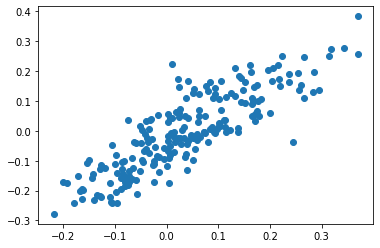

In [357]:
plt.scatter(Jon, Jiayao)
pearsonr(Jon, Jiayao)

In [356]:
print(len(set(Jon_ssc_match["LABEL"].values[:50]).intersection(set(Jw_ssc_match["STR"].values[:50]))))

34
